In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d 
import os
from tqdm.auto import tqdm
from numba import njit,prange
import scipy

# loading all of the csv's from all of the simulations with the macro measured data (total energy, ent. excess, Paccept....)
simlist = []
datafiles = []
csvfiles = []
for root, dirs, files in os.walk("../data/pdanneal/"):
    for file in files:
        if file.endswith(".npz"):
            datafiles.append(os.path.join(root,file))
        if file.endswith(".csv"):
            csvfiles.append(os.path.join(root,file))
    for name in dirs:
        simlist.append(name)
simlist = sorted(simlist)
datafiles = sorted(datafiles)
csvfiles = sorted(csvfiles)
print(len(simlist))
print(len(datafiles))
print(len(csvfiles))
assert len(simlist) == len(datafiles) == len(csvfiles)


def load_csv(fname,verbose=True):
    if verbose:
        with open(fname) as f:
            print(f.readline().strip('\n'))
    return np.loadtxt(fname,skiprows=1,delimiter=",")

def plot_energy(fpath,csv1,save=False):
    fig,ax1 = plt.subplots()
    ax1.set_title(simlist[0])
    ax1.plot(csv1[:,0],csv1[:,1],label="TotalEnergy")
    ax1.set_xlabel("timesteps")
    ax1.set_ylabel("Total Energy")
    ax1.tick_params(axis ='y', labelcolor="tab:blue")
    ax2  = ax1.twinx()
    ax2.plot(csv1[:,0],csv1[:,2],label="Eexcess",color="tab:orange")
    ax2.set_ylabel("Ent. Excess")
    ax2.tick_params(axis ='y', labelcolor = "tab:orange")
    plt.show()
    if save:
        fname = fpath[:-4]+"_energy.png"
        print(fname)
        fig.savefig(fname)
    
@njit
def calc_n_corr(nx,ny,nz,nshells):
    g = np.zeros(nshells)
    c = np.zeros(nshells)
    ni,nj,nk = nx.shape
    for i in range(ni):
        for j in range(nj):
            for k in range(nk):
                for di in np.arange(-nshells,nshells+1):
                    for dj in np.arange(-nshells,nshells+1):
                        for dk in np.arange(-nshells,nshells+1):
                            r2 = di*di + dj*dj + dk*dk
                            if r2 < nshells*nshells:
                                rr = np.sqrt(r2)
                                ii = i + di
                                jj = j + dj
                                kk = k + dk
                                if (ii < ni) and (jj < nj) and (kk < nk) and (ii >= 0) and (jj >= 0) and (kk >= 0):
                                    ishell = int(np.floor(rr))
                                    g[ishell] = g[ishell] + (nx[i,j,k]*nx[ii,jj,kk] + ny[i,j,k]*ny[ii,jj,kk] + nz[i,j,k]*nz[ii,jj,kk])**2
                                    c[ishell] += 1
    for ishell in np.arange(nshells):
        g[ishell] = g[ishell]/c[ishell]
    return g,c
                                
@njit
def calc_s_corr(s,nshells):
    g = np.zeros(nshells)
    c = np.zeros(nshells)
    ni,nj,nk = s.shape
    s_avg2 = np.mean(s)**2
    for i in range(ni):
        for j in range(nj):
            for k in range(nk):
                #print(i,j,k)
                for di in np.arange(-nshells,nshells+1):
                    for dj in np.arange(-nshells,nshells+1):
                        for dk in np.arange(-nshells,nshells+1):
                            r2 = di*di + dj*dj + dk*dk
                            if r2 < nshells*nshells:
                                rr = np.sqrt(r2)
                                ii = i + di
                                jj = j + dj
                                kk = k + dk
                                if (ii < ni) and (jj < nj) and (kk < nk) and (ii >= 0) and (jj >= 0) and (kk >= 0):
                                    ishell = int(np.floor(rr))
                                    #assert ishell > 0
                                    g[ishell] = g[ishell] + s[i,j,k] * s[ii,jj,kk] - s_avg2
                                    c[ishell] += 1
    for ishell in np.arange(nshells):
        g[ishell] = g[ishell]/c[ishell]# - s_avg2
    return g,c

def plot_s_corr(fpath,g):
    nshells = len(g)
    fig,ax = plt.subplots()
    ax.set_title(fpath.split("/")[-2])
    ax.plot(np.arange(nshells),g)
    ax.set_ylabel("Chiral Correlation")
    ax.set_xlabel("Shells")
    plt.show()

def plot_n_corr(fpath,g):
    nshells = len(g)
    fig,ax = plt.subplots()
    ax.set_title(fpath.split("/")[-2])
    ax.plot(np.arange(nshells),g)
    ax.set_ylabel("Nematic Correlation")
    ax.set_xlabel("Shells")
    plt.show()

def func(x, a, l):
    return a * np.exp(-x/l)
    
def fit_corr_exp(g):
    nshells = len(g)
    popt,pcov = scipy.optimize.curve_fit(func,np.arange(nshells),g)
    return popt[0],popt[1]

def func2(x, a, l, c):
    return a * np.exp(-x/l) + c

def func3(x,a,l):
    return a*np.exp(-x/l)

def fit_func4(x,a,l):
    return (a/x)*np.exp(-x/l)

def fit_func4c(x,a,l,c):
    return (a/x)*np.exp(-x/l) + c

def fit_corr_exp4(g):
    nshells=  len(g)
    popt,pcov = scipy.optimize.curve_fit(fit_func4,np.arange(nshells),g)
    return popt[0],popt[1]

def fit_corr_exp4c(g):
    nshells =  len(g)
    popt,pcov = scipy.optimize.curve_fit(fit_func4c,np.arange(nshells),g)
    return popt[0],popt[1],popt[2]
    
def fit_corr_exp2(g):
    nshells = len(g)
    popt,pcov = scipy.optimize.curve_fit(func3,np.arange(nshells),g)
    return popt[0],popt[1]#, popt[2]

def fit_corr_exp2c(g):
    nshells = len(g)
    popt,pcov = scipy.optimize.curve_fit(func2,np.arange(nshells),g)
    return popt[0],popt[1],popt[2]

    
%matplotlib ipympl
print(len(datafiles))

390
390
390
390


../data/pdanneal/pdanneal_K1.0_kbt0.05/pdanneal_K1.0_kbt0.05_data.npz


[]

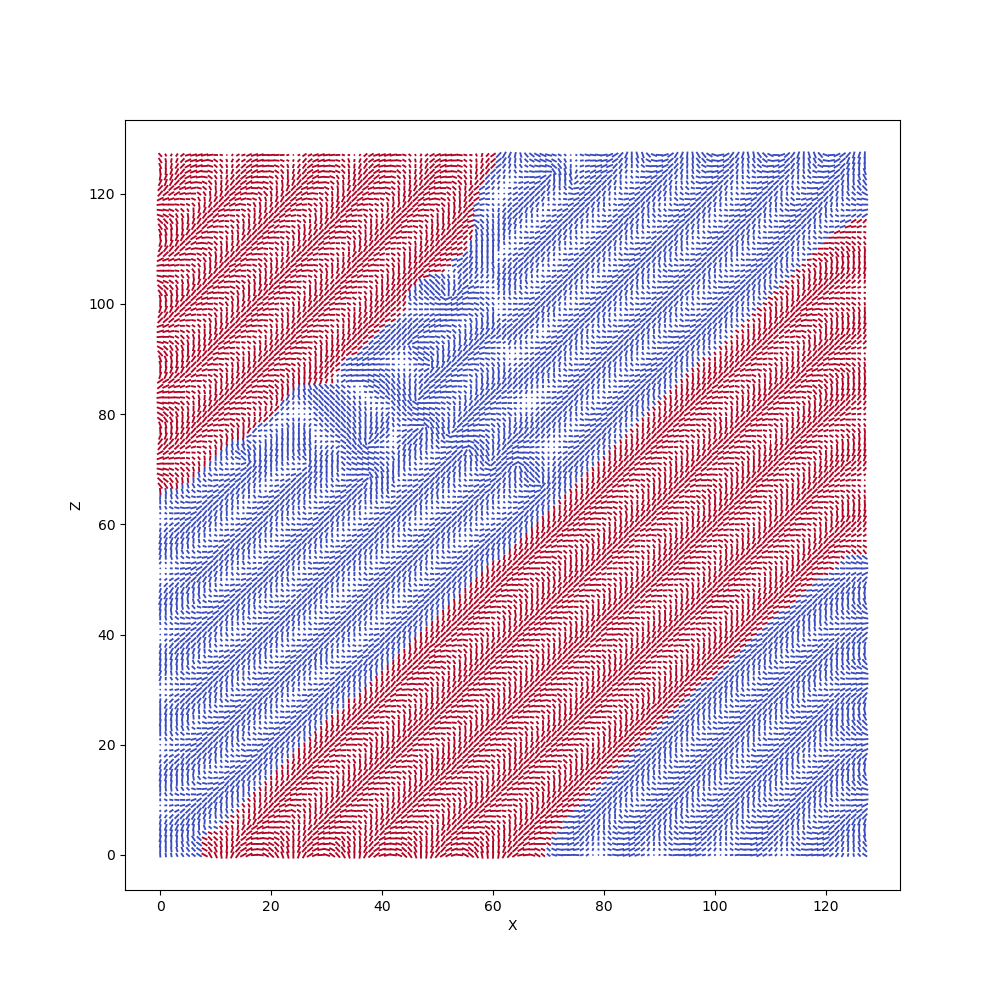

In [2]:
datafile = datafiles[120] #371,242
print(datafile)
data = np.load(datafile)
ni,nj,nk = data['nx'].shape
X,Z = np.meshgrid(np.arange(0,ni),np.arange(0,nk))
mp = int(np.floor(nj/2))
u = data['nx'][:,mp,:]
v = data['ny'][:,mp,:]
w = data['nz'][:,mp,:]
s_color = data['s'][:,mp,:]
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)

ax.quiver(X,Z,u,w,s_color,pivot='mid',headlength=0,headwidth=0,headaxislength=0,scale_units='xy',scale=0.75,cmap='coolwarm')
ax.set_xlabel('X')
ax.set_ylabel('Z')
plt.plot()

../data/pdanneal/pdanneal_K1.0_kbt0.05/pdanneal_K1.0_kbt0.05_data.npz
[0.98527526 0.95275202 0.92981049 0.90586168 0.88167571 0.85856051
 0.83489422 0.8126696  0.78838869 0.76464809 0.74099127 0.7174496
 0.69504221 0.66871439 0.64579554 0.62253708]
[2.09715200e+06 5.36458160e+07 1.34704080e+08 3.18232056e+08
 4.65558264e+08 8.06058112e+08 9.13109240e+08 1.41586510e+09
 1.64179651e+09 2.18961149e+09 2.51265806e+09 2.96753088e+09
 3.55219338e+09 4.21437552e+09 4.46331842e+09 5.33715887e+09]


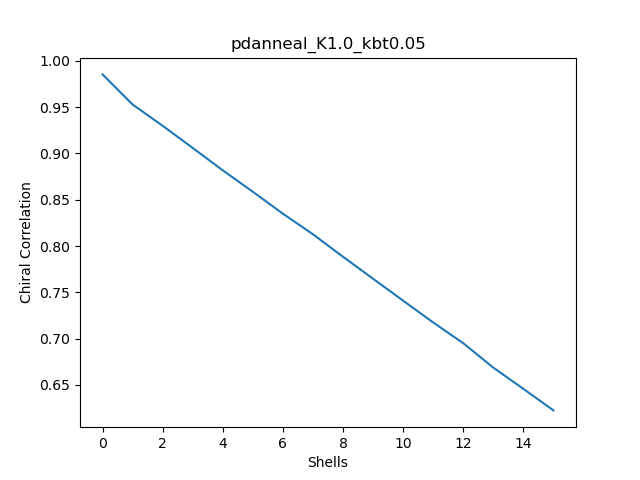

In [3]:
datafile = datafiles[120]
print(datafile)
data = np.load(datafile)
ni,nj,nk = data['nx'].shape
 
nshells = 16
g,c = calc_s_corr(np.array(data['s']),nshells)
print(g)
print(c)
plot_s_corr(datafile,g)
# g,c = calc_n_corr(np.array(data['nx']),np.array(data['ny']),np.array(data['nz']),nshells)
# plot_n_corr(datafile,g)

1.0 1.0 1.0
128


/tmp/ipykernel_140878/3082706222.py:139: RuntimeWarning: divide by zero encountered in divide
  return (a/x)*np.exp(-x/l)
/tmp/ipykernel_140878/3082706222.py:146: OptimizeWarning: Covariance of the parameters could not be estimated
  popt,pcov = scipy.optimize.curve_fit(fit_func4,np.arange(nshells),g)


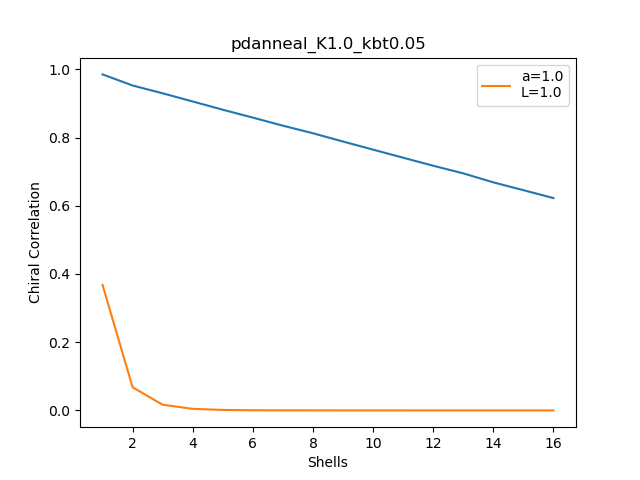

In [5]:
#a,l,c = fit_corr_exp4c(g)
a,l = fit_corr_exp4(g)
#a,l,c = fit_corr_exp4c(g)
print(a,l,c)
print(np.array(data['s']).shape[0])
nshells = len(g)
fig,ax = plt.subplots()
ax.set_title(datafile.split("/")[-2])
ax.plot(np.arange(1,nshells+1),g)
#ax.plot(np.arange(1,nshells+1),fit_func4c(np.arange(1,nshells+1),a,l,c),label="a="+str(np.round(a,5))+"\nL="+str(np.round(l,5)))
ax.plot(np.arange(1,nshells+1),fit_func4(np.arange(1,nshells+1),a,l),label="a="+str(np.round(a,5))+"\nL="+str(np.round(l,5)))
#ax.plot(np.arange(nshells),func(np.arange(nshells),0.1,1))
ax.set_ylabel("Chiral Correlation")
ax.set_xlabel("Shells")
ax.legend()
plt.show()

In [4]:
Ks = []
kbts = []
for csvfile in csvfiles:
    csv1 = load_csv(csvfile,verbose=False)
    K = float(csvfile.split("/")[3].split("_")[-2][1:])
    kbt = float(csvfile.split("/")[3].split("_")[-1][3:])
    Ks.append(K)
    kbts.append(kbt)
Ks = sorted(list(set(Ks))) #list of all Ks w/ duplicates removed
kbts = sorted(list(set(kbts))) # list of all Kbts w/ duplicates removed
print(Ks)
print(kbts)
#NOTE: THIS TAKES ABOUT 22 HOURS TO RUN 
ch_l = np.zeros((len(kbts),len(Ks)))
for datafile in tqdm(datafiles):
    data = np.load(datafile)
    K = float(datafile.split("/")[3].split("_")[-2][1:])
    kbt = float(datafile.split("/")[3].split("_")[-1][3:])
    if K in Ks:
        K_index = Ks.index(K)
        kbt_index = kbts.index(kbt)
        ni,nj,nk = data['nx'].shape    
        nshells = 16
        g,c = calc_s_corr(np.array(data['s']),nshells)
        #a,l,c = fit_corr_exp2(g)
        #a,l = fit_corr_exp2(g)
        a,l = fit_corr_exp4(g) # (a/x)*exp(-x/l)
        if l > np.array(data['s']).shape[0]:
            l = np.array(data['s']).shape[0]
        ch_l[kbt_index,K_index] = l
#np.savez_compressed("large_alignedlong4_ch_l3.npz",ch_l=ch_l)
np.savez_compressed("pdanneal_ch_len3.npz",ch_l=ch_l)

[0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75, 3.0]
[0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0, 1.05, 1.1, 1.15, 1.2, 1.25, 1.3, 1.35, 1.4, 1.45, 1.5]


  0%|          | 0/390 [00:00<?, ?it/s]

/tmp/ipykernel_1649/2746354315.py:140: OptimizeWarning: Covariance of the parameters could not be estimated
  popt,pcov = scipy.optimize.curve_fit(func3,np.arange(nshells),g)


In [12]:
Tin = 1.1224*(2.0/3.0)
Ks = []
kbts = []
for csvfile in csvfiles:
    csv1 = load_csv(csvfile,verbose=False)
    K = float(csvfile.split("/")[3].split("_")[-2][1:])#*(2.0/3.0)
    kbt = float(csvfile.split("/")[3].split("_")[-1][3:])
    Ks.append(K)
    kbts.append(kbt)#/Tin)
Ks = sorted(list(set(Ks))) #list of all Ks w/ duplicates removed
kbts = sorted(list(set(kbts))) # list of all Kbts w/ duplicates removed
print(Ks)
print(kbts)
data = np.load("large_alignedlong4_ch_l2.npz")
ch_l = data['ch_l']

[0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75, 3.0]
[0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0, 1.05, 1.1, 1.15, 1.2, 1.25, 1.3, 1.35, 1.4, 1.45, 1.5]


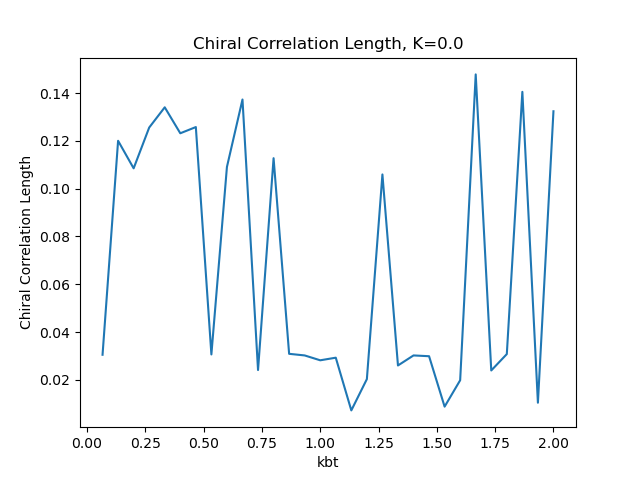

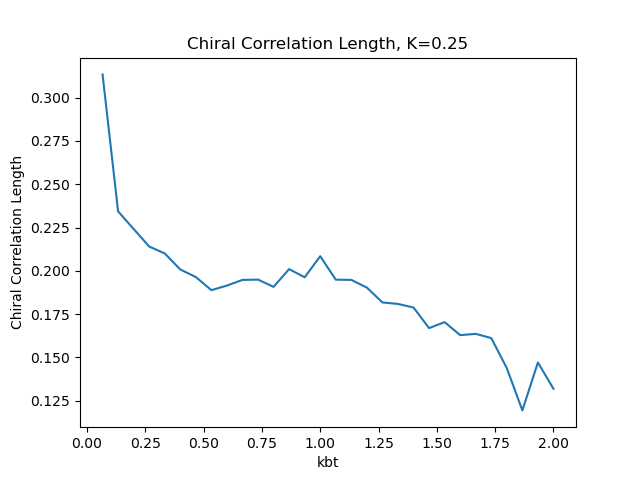

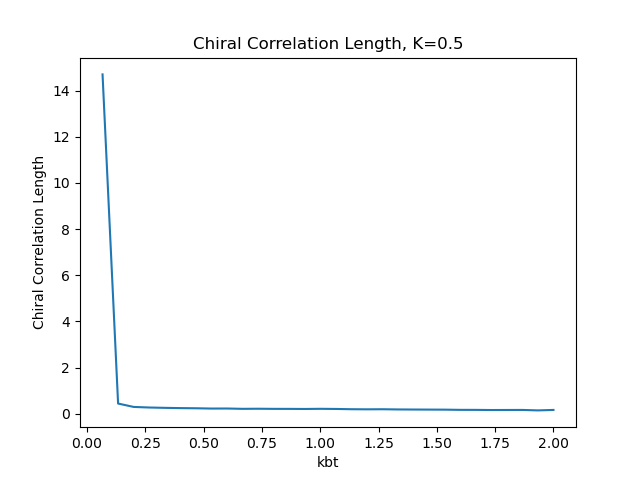

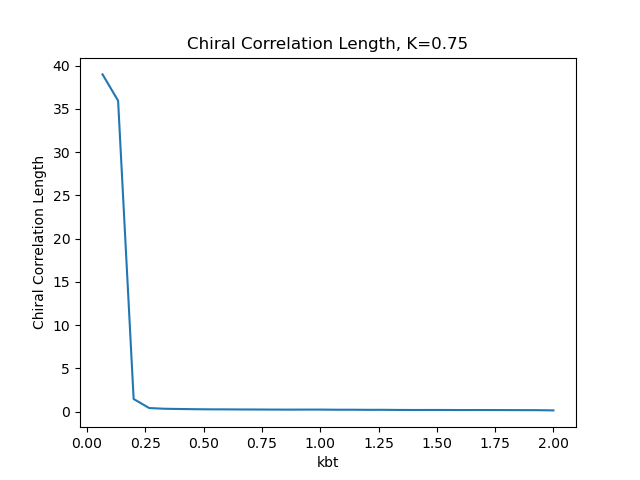

/tmp/ipykernel_129606/2124530487.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()


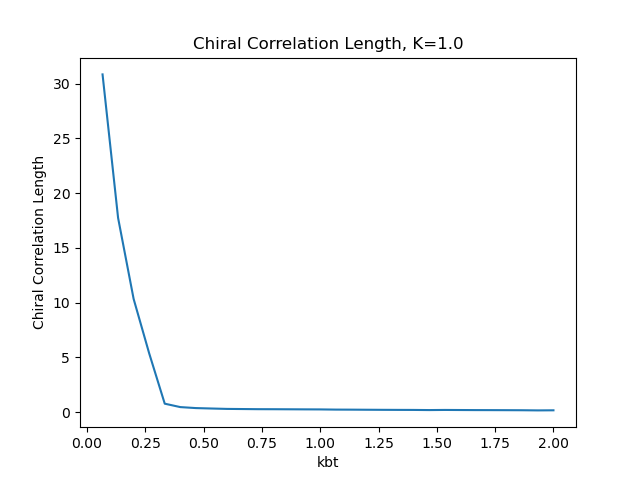

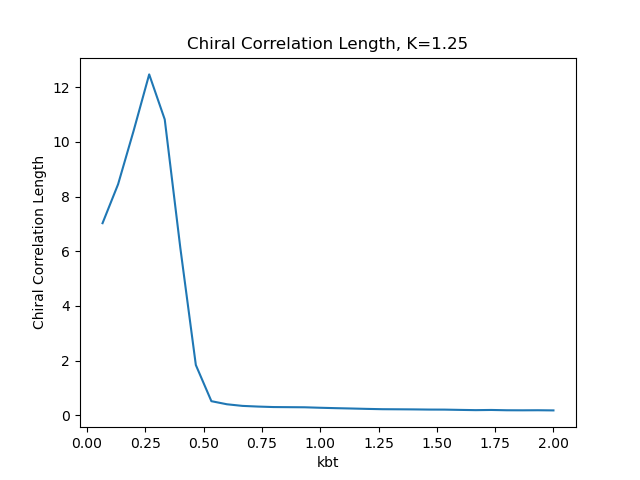

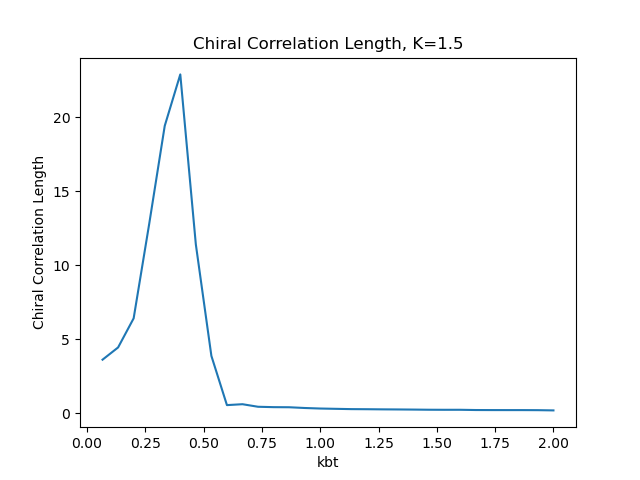

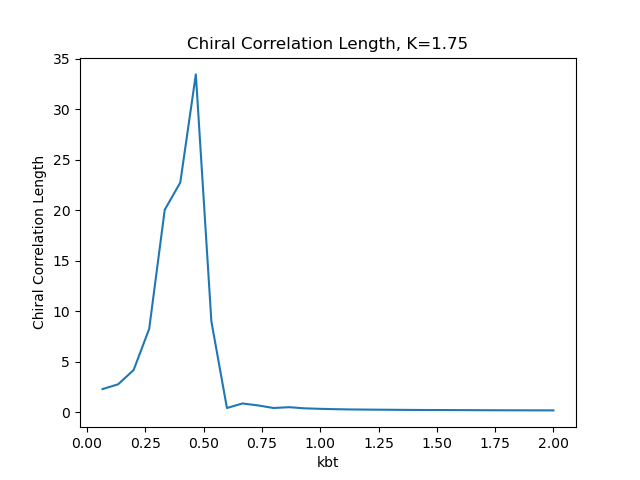

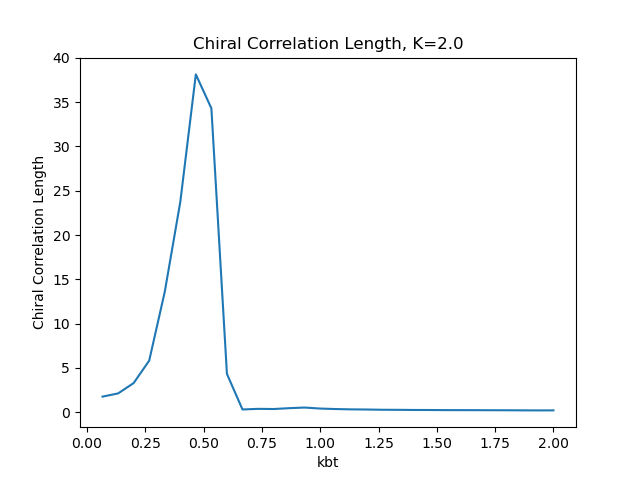

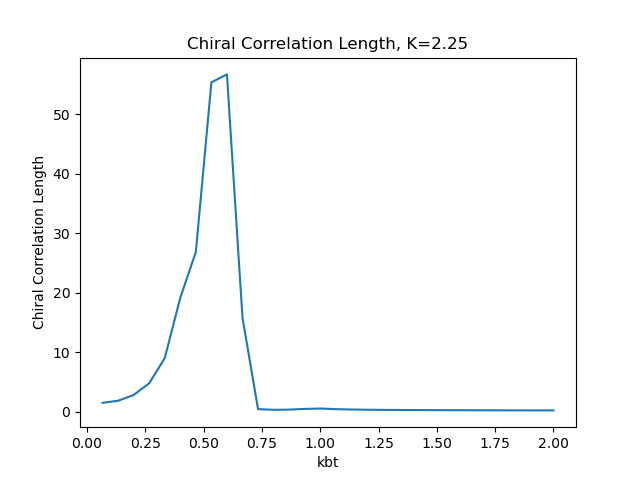

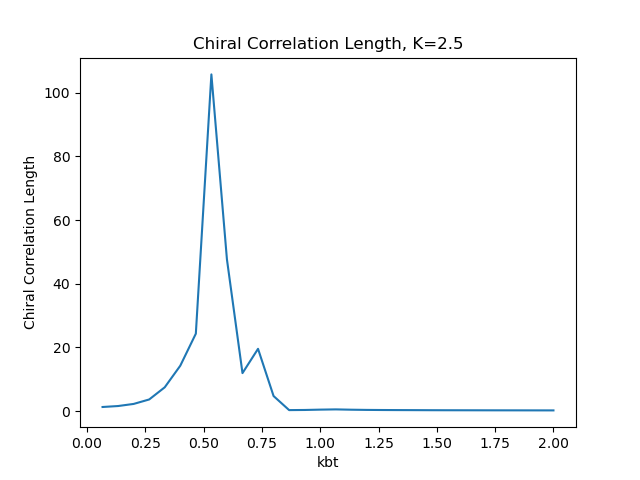

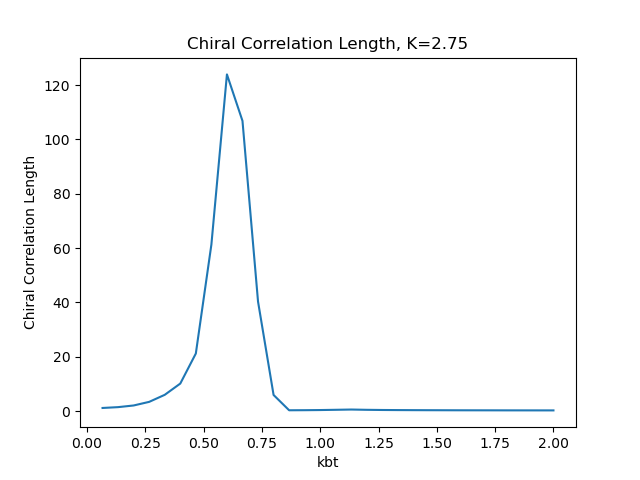

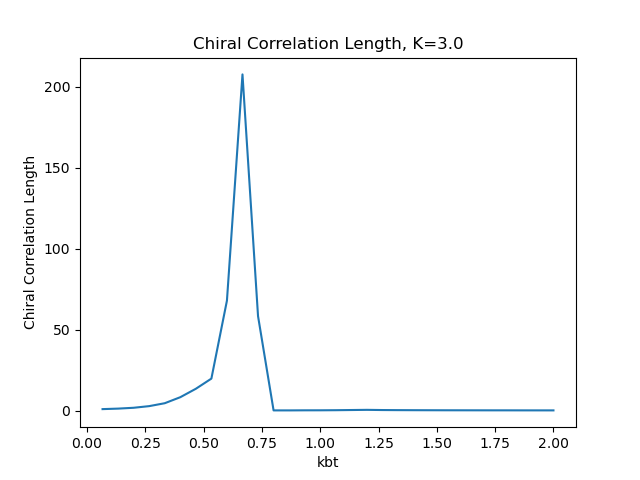

In [8]:
for i in np.arange(len(Ks)):
    fig,ax = plt.subplots()
    ax.set_title("Chiral Correlation Length, K="+str(Ks[i]))
    ax.set_ylabel("Chiral Correlation Length")
    ax.set_xlabel("kbt")
    ax.plot(kbts,ch_l[:,i])
    plt.show()
    fig.savefig("chiral_corr_len_K"+"{:.2f}".format(Ks[i])+".png")

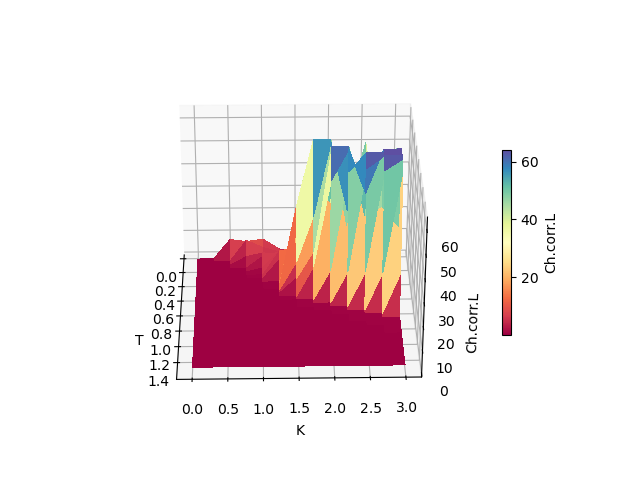

In [18]:
X,Y = np.meshgrid(kbts,Ks)
fig,ax1 = plt.subplots(subplot_kw={"projection": "3d"})
ax1.set_ylabel("K")#/J")
ax1.set_xlabel("T")#/Tin")
ax1.set_zlim(0,64)
ax1.set_zlabel("Ch.corr.L")
ax1.view_init(30, -1,0)
surf1 = ax1.plot_surface(X, Y, ch_l.T, cmap='Spectral',linewidth=0, antialiased=False)
#surf1 = ax1.plot_wireframe(X, Y, ch_l.T, cmap='viridis',linewidth=0.5, antialiased=False)
cbar1 = plt.colorbar(surf1, ax=ax1,shrink=0.5)
cbar1.set_label('Ch.corr.L', rotation=90)

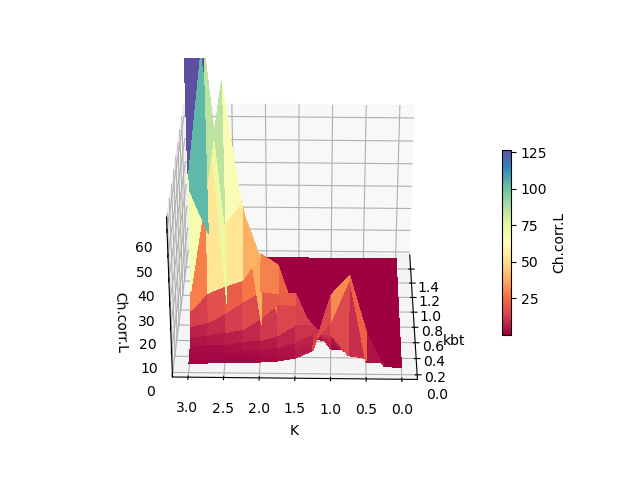

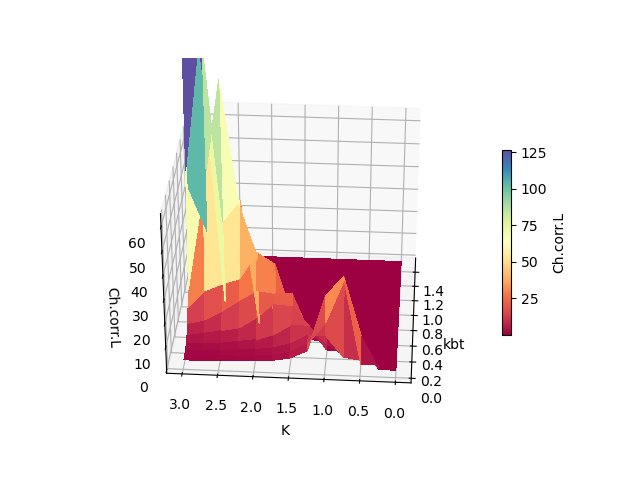

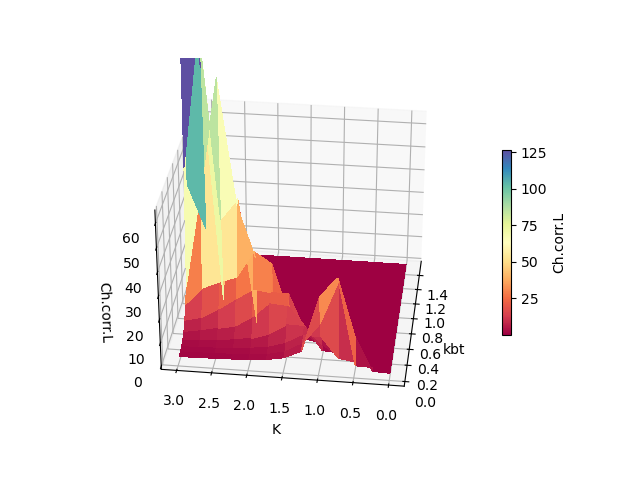

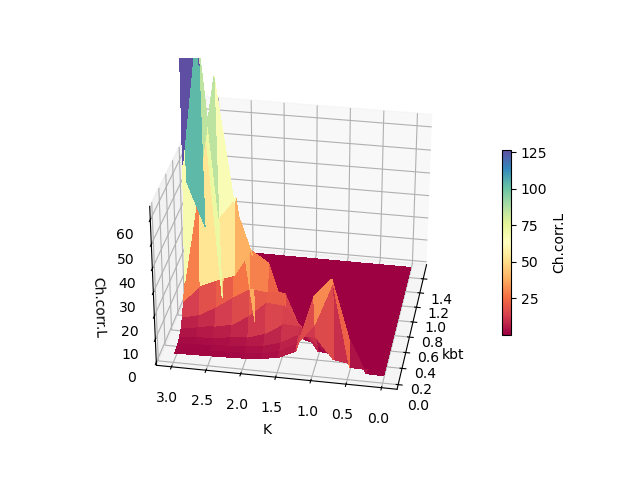

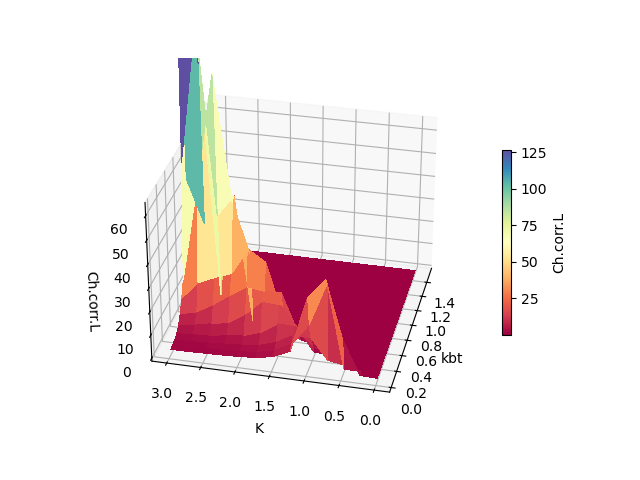

...

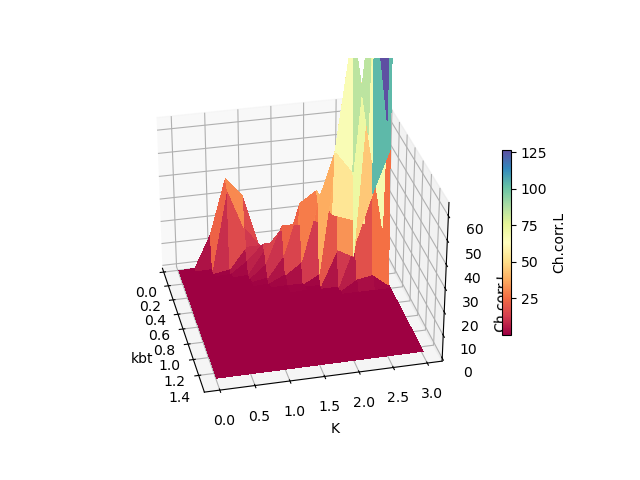

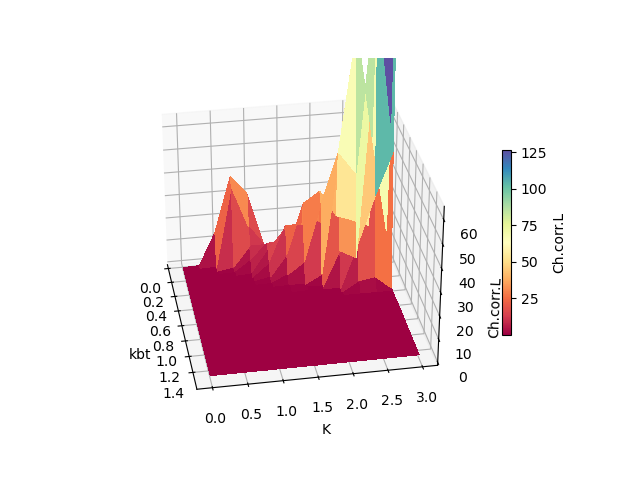

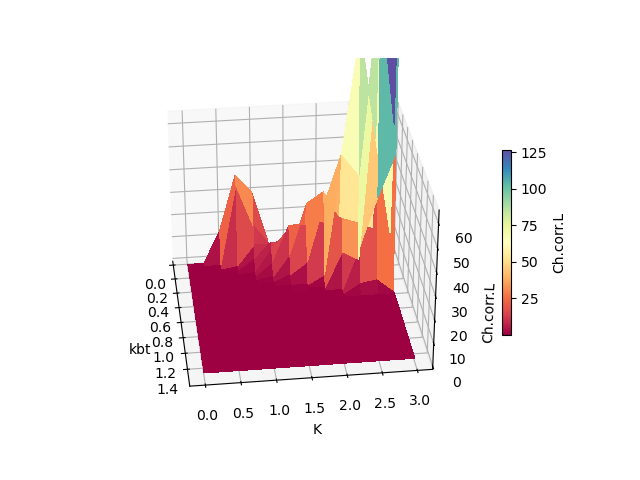

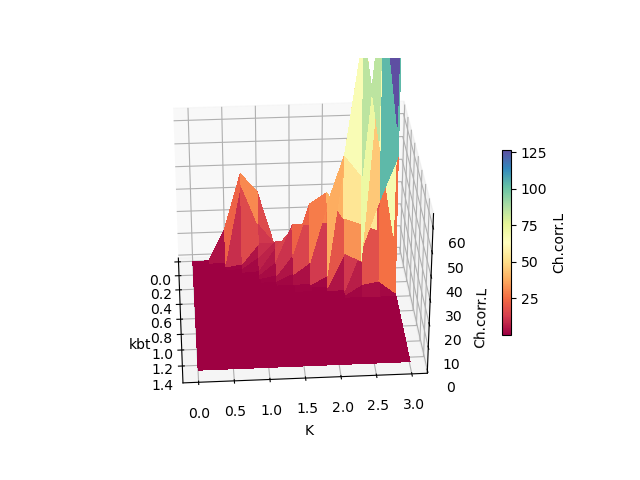

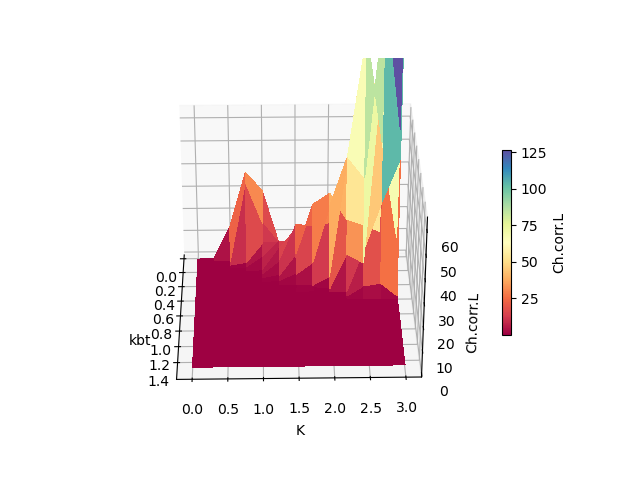

In [25]:
for i,angle in enumerate(np.linspace(-179,-1,60)):
    fig, ax1 = plt.subplots(subplot_kw={"projection": "3d"})
    X,Y = np.meshgrid(kbts,Ks)
    ax1.set_ylabel("K")
    ax1.set_xlabel("kbt")
    ax1.set_zlim(0,64)
    ax1.set_zlabel("Ch.corr.L")
    ax1.view_init(30, angle,0)
    surf1 = ax1.plot_surface(X, Y, ch_l.T, cmap='Spectral',linewidth=0, antialiased=False)
    cbar1 = plt.colorbar(surf1, ax=ax1,shrink=0.5)
    cbar1.set_label('Ch.corr.L', rotation=90)
    fig.savefig("Figure_"+str(i).zfill(2)+".png")

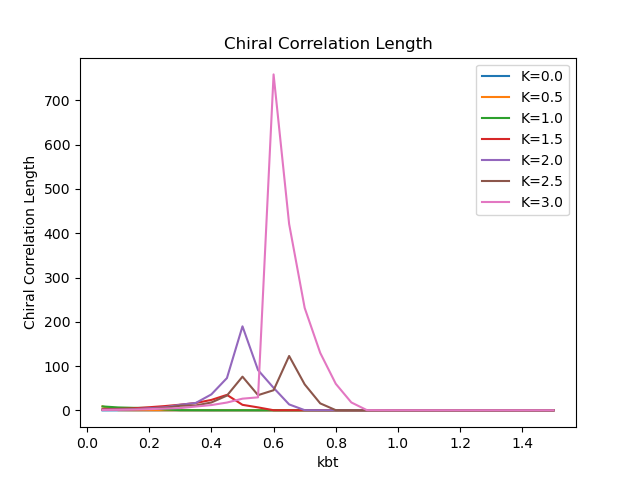

In [87]:
fig,ax = plt.subplots()
ax.set_title("Chiral Correlation Length")
ax.set_ylabel("Chiral Correlation Length")
ax.set_xlabel("kbt")
for i in np.arange(0,len(Ks),2):
    ax.plot(kbts,ch_l[:,i],label="K="+str(Ks[i]))
ax.legend()
plt.show()

../data/400000/phasediag_alignedlong4_K0.25_kbt0.1/phasediag_alignedlong4_K0.25_kbt0.1_data.npz
[1.         0.95663927 0.94849417 0.945496   0.94400276 0.94312783
 0.9425768  0.94221039 0.94195752 0.9417892  0.94164458 0.94158227
 0.94153169 0.94148773 0.94143965 0.94139241]
[2.62144000e+05 6.59685600e+06 1.63813920e+07 3.81772720e+07
 5.51429040e+07 9.42782720e+07 1.05456888e+08 1.61325576e+08
 1.84654240e+08 2.42789088e+08 2.75049608e+08 3.19915392e+08
 3.77668704e+08 4.41714784e+08 4.60851096e+08 5.42773208e+08]


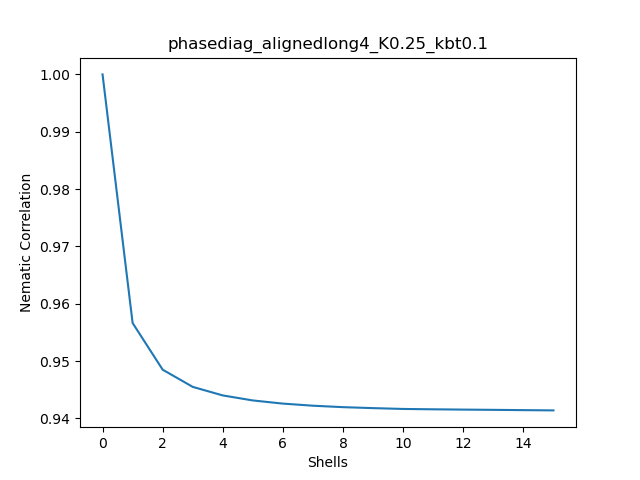

In [32]:
datafile = datafiles[31]
print(datafile)
data = np.load(datafile)
ni,nj,nk = data['nx'].shape

nshells = 16
g,c = calc_n_corr(np.array(data['nx']),np.array(data['ny']),np.array(data['nz']),nshells)
print(g)
print(c)
plot_n_corr(datafile,g)

0.05751447243574067 0.783018693772107 0.942226205782103


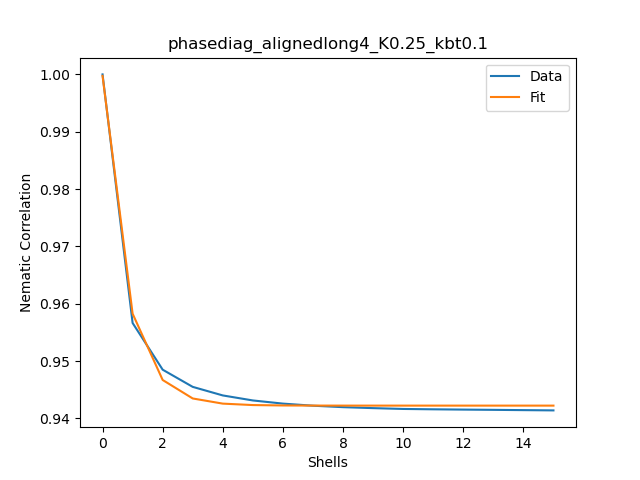

In [43]:
a,l,c = fit_corr_exp2(g)
print(a,l,c)
nshells = len(g)
fig,ax = plt.subplots()
ax.set_title(datafile.split("/")[-2])
ax.plot(np.arange(nshells),g,label="Data")
ax.plot(np.arange(nshells),func2(np.arange(nshells),a,l,c),label="Fit")
#ax.plot(np.arange(nshells),func(np.arange(nshells),0.1,1))
ax.set_ylabel("Nematic Correlation")
ax.set_xlabel("Shells")
ax.legend()
plt.show()

In [44]:
Ks = []
kbts = []
for csvfile in csvfiles:
    csv1 = load_csv(csvfile,verbose=False)
    K = float(csvfile.split("/")[3].split("_")[-2][1:])
    kbt = float(csvfile.split("/")[3].split("_")[-1][3:])
    Ks.append(K)
    kbts.append(kbt)
Ks = sorted(list(set(Ks))) #list of all Ks w/ duplicates removed
kbts = sorted(list(set(kbts))) # list of all Kbts w/ duplicates removed
print(Ks)
print(kbts)
#NOTE: THIS TAKES ABOUT 3.5 HOURS TO RUN
n_l = np.zeros((len(kbts),len(Ks)))
for datafile in tqdm(datafiles):
    data = np.load(datafile)
    K = float(datafile.split("/")[3].split("_")[-2][1:])
    kbt = float(datafile.split("/")[3].split("_")[-1][3:])
    if K in Ks:
        K_index = Ks.index(K)
        kbt_index = kbts.index(kbt)
        ni,nj,nk = data['nx'].shape    
        nshells = 16
        g,c = calc_n_corr(np.array(data['nx']),np.array(data['ny']),np.array(data['nz']),nshells)
        a,l,c = fit_corr_exp2(g)
        n_l[kbt_index,K_index] = l
np.savez_compressed("alignedlong4_n_l.npz",n_l=n_l)

[0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75, 3.0]
[0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0, 1.05, 1.1, 1.15, 1.2, 1.25, 1.3, 1.35, 1.4, 1.45, 1.5]


  0%|          | 0/390 [00:00<?, ?it/s]

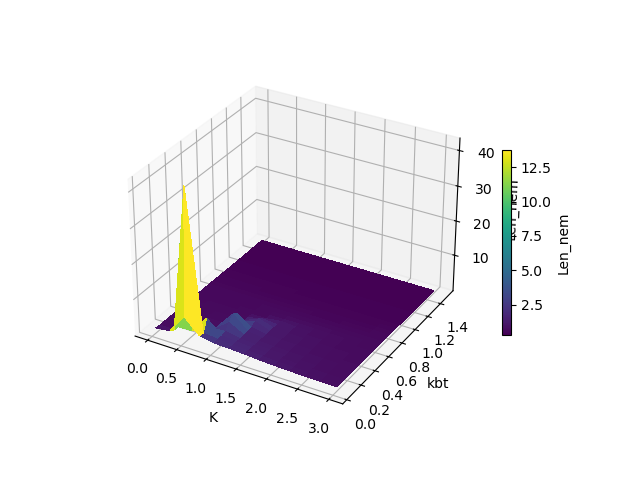

In [54]:
X,Y = np.meshgrid(Ks,kbts)
fig,ax1 = plt.subplots(subplot_kw={"projection": "3d"})
ax1.set_ylabel("kbt")
ax1.set_xlabel("K")
ax1.set_zlabel("Len_nem")
surf1 = ax1.plot_surface(X, Y, n_l, cmap='viridis',linewidth=0, antialiased=False)
cbar1 = plt.colorbar(surf1, ax=ax1,shrink=0.5)
cbar1.set_label('Len_nem', rotation=90)

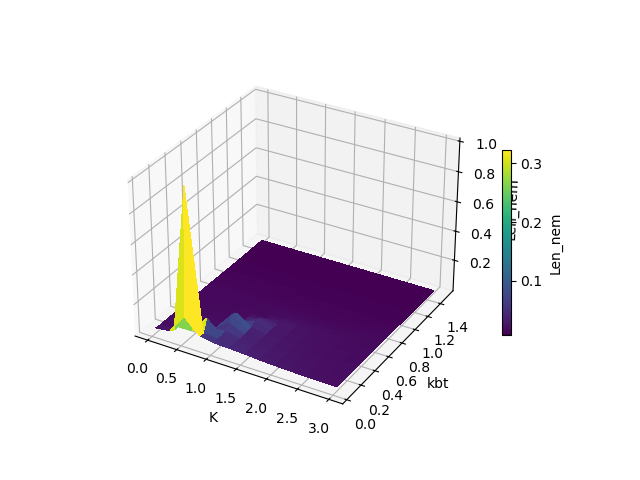

In [56]:
X,Y = np.meshgrid(Ks,kbts)
norm_n_l = n_l / np.max(n_l)
fig,ax1 = plt.subplots(subplot_kw={"projection": "3d"})
ax1.set_ylabel("kbt")
ax1.set_xlabel("K")
ax1.set_zlabel("Len_nem")
surf1 = ax1.plot_surface(X, Y, norm_n_l, cmap='viridis',linewidth=0, antialiased=False)
cbar1 = plt.colorbar(surf1, ax=ax1,shrink=0.5)
cbar1.set_label('Len_nem', rotation=90)

In [32]:
"{:.2f}".format(1.5)+".png"

'1.50.png'